<a href="https://colab.research.google.com/github/fares37665/watershed/blob/master/watershed_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.display import Image
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.io import imread
from skimage import data
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb, rgb2gray
import skimage.morphology as morpho  
from scipy import ndimage as ndi
import matplotlib.image as mpimgmp
import time
# calcul de gradient avec sobel
def sobel(im):
  grayimg = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
  height,width=grayimg.shape
  gradimg = np.zeros(shape=grayimg.shape)
  for i in range(0,width-1):
    for j in range(0,height-1):
        a=(int(grayimg[j+1][i-1]+grayimg[j+1][i]+grayimg[j+1][i+1])-int(grayimg[j-1][i-1]+grayimg[j-1][i]+grayimg[j-1][i+1]))
        b=(int(grayimg[j+1][i+1]+grayimg[j][i+1]+grayimg[j-1][i+1])-int(grayimg[j+1][i-1]+grayimg[j][i-1]+grayimg[j-1][i-1]))
        gradimg[j][i]=int(np.sqrt(a**2+b**2))
  return gradimg

#calcul de gradient avec prewitt
def prewitt(im):
  grayimg = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
  height,width=grayimg.shape
  gradimg = np.zeros(shape=grayimg.shape)
  for i in range(0,width-1):
    for j in range(0,height-1):
        a=(int(grayimg[j+1][i-1]+2*grayimg[j+1][i]+grayimg[j+1][i+1])-int(grayimg[j-1][i-1]+2*grayimg[j-1][i]+grayimg[j-1][i+1]))
        b=(int(grayimg[j+1][i+1]+2*grayimg[j][i+1]+grayimg[j-1][i+1])-int(grayimg[j+1][i-1]+2*grayimg[j][i-1]+grayimg[j-1][i-1]))
        gradimg[j][i]=int(np.sqrt(a**2+b**2))
  return gradimg

#seuillage de la carte de distance "norm_img" avec la valeur 'a'
def seuiletlabel(norm_image,a):
  bw=norm_image<a
  bw=bw*1
  bw=bw*1
  label_image,n = label(bw,neighbors=4,return_num=True)
  image_label_overlay = label2rgb(label_image, image=norm_image)
  return(label_image)

#fusionner (la carte de distance)*d et le gradient   avec 'd' cste a l'entré a optimiser
def fusionimg (norm_image,gradimg,d):
  h,w=np.shape(norm_image)
  fusion=np.zeros((h,w))
  for i in range(h):
     for j in range(w):
         fusion[i][j]= d*norm_image[i][j]+gradimg[i][j]
  return fusion


def cartedistance0(carte1):
    h,w=carte1.shape
    #plt.imshow(carte1,cmap="gray")
    for j in range(0,h):
        for i in range(0,w):
            if(i==0 and j==0):
                a=0 #do nothing
            elif(i==0):
                carte1[j][i]=min([carte1[j-1][i]+1,carte1[j][i],carte1[j-1][i+1]+1])
            elif(j==0):
                carte1[j][i]=min([carte1[j][i-1]+1,carte1[j][i]])
            elif(i==(w-1)):
                carte1[j][i]=min([carte1[j-1][i]+1,carte1[j][i-1]+1,carte1[j-1][i-1]+1,carte1[j][i]])
            else:
                carte1[j][i]=min([carte1[j-1][i]+1,carte1[j][i-1]+1,carte1[j-1][i-1]+1,carte1[j][i],carte1[j-1][i+1]+1])

    for j in range(h-1,0,-1):
        for i in range(w-1,0,-1):
            if(i==(w-1) and j==(h-1)):
                a=0 #do nothing
            elif(i==(w-1)):
                carte1[j][i]=min([carte1[j+1][i]+1,carte1[j][i],carte1[j+1][i-1]+1])
            elif(j==(h-1)):
                carte1[j][i]=min([carte1[j][i+1]+1,carte1[j][i]])
            elif(i==0):
                carte1[j][i]=min([carte1[j+1][i]+1,carte1[j][i+1]+1,carte1[j+1][i+1]+1,carte1[j][i]])
            else:
                carte1[j][i]=min([carte1[j+1][i]+1,carte1[j][i+1]+1,carte1[j+1][i+1]+1,carte1[j][i],carte1[j+1][i-1]+1])      
    norm_image = cv2.normalize(carte1, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
    norm_image=norm_image.astype(np.uint8)
    plt.imshow(norm_image)
    return norm_image

#calcule carte de distance avec la version sequentiel aves mask [[4 3 4] [3 0 3] [4 3 4]]
def cartedistance(carte1):
    h,w=carte1.shape
    #plt.imshow(carte1,cmap="gray")
    for j in range(0,h):
        for i in range(0,w):
            if(i==0 and j==0):
                a=0 #do nothing
            elif(i==0):
                carte1[j][i]=min([carte1[j-1][i]+3,carte1[j][i],carte1[j-1][i+1]+4])
            elif(j==0):
                carte1[j][i]=min([carte1[j][i-1]+3,carte1[j][i]])
            elif(i==(w-1)):
                carte1[j][i]=min([carte1[j-1][i]+3,carte1[j][i-1]+3,carte1[j-1][i-1]+4,carte1[j][i]])
            else:
                carte1[j][i]=min([carte1[j-1][i]+3,carte1[j][i-1]+3,carte1[j-1][i-1]+4,carte1[j][i],carte1[j-1][i+1]+4])

    for j in range(h-1,0,-1):
        for i in range(w-1,0,-1):
            if(i==(w-1) and j==(h-1)):
                a=0 #do nothing
            elif(i==(w-1)):
                carte1[j][i]=min([carte1[j+1][i]+3,carte1[j][i],carte1[j+1][i-1]+4])
            elif(j==(h-1)):
                carte1[j][i]=min([carte1[j][i+1]+3,carte1[j][i]])
            elif(i==0):
                carte1[j][i]=min([carte1[j+1][i]+3,carte1[j][i+1]+3,carte1[j+1][i+1]+4,carte1[j][i]])
            else:
                carte1[j][i]=min([carte1[j+1][i]+3,carte1[j][i+1]+3,carte1[j+1][i+1]+4,carte1[j][i],carte1[j+1][i-1]+4])      

    norm_image = cv2.normalize(carte1, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
    norm_image=norm_image.astype(np.uint8)
    plt.imshow(norm_image)
    return norm_image


#creer les centres des cellules resultant de la pavage hexagonal
def centers_create(gradim,cell_widht):
  centers= np.zeros(shape=gradim.shape)
  height1,width1=centers.shape
  c=cell_widht
  pas=int(3*c)
  pash=int(float(c)*float(np.sqrt(3))/2.0)
  a=0;
  point=[]
  for j in range(0,height1,pash):
    for i in range(a,width1,pas):
      centers[j][i]=255
      #print(i,j)
      point.append([i,j])
    if(a==0):
      a=int(float(pas)/2)
    else:
      a=0
  return centers,point

#creer la carte initial necessaire pour le calcule de carte de distance
def carte_create(centers):
  carte= np.full(centers.shape,np.inf)
  width1,height1=centers.shape
  for j in range(0,height1):
    for i in range(0,width1):
        if(centers[i][j]!=0): 
            carte[i][j]=0
  return carte

# le calcule du marqueur (chercher la plus grande composante connexe composé de  minimums de gradient)
def markeur(gradimg,point,cell_widht,label_image):
  ss=3
  c=int(cell_widht)
  pash=int(float(cell_widht)*float(np.sqrt(3))/2.0)
  result=np.full(gradimg.shape,np.inf)
  mrk=np.zeros(gradimg.shape)
  h,w=gradimg.shape
  for a in range(0,len(point)):
    x,y=point[a]
    subimage=gradimg[max(y-pash+ss,0):min(y+pash-ss,h),max(x-c+ss,0):min(x+c-ss,w)]
    sublabel=label_image[max(y-pash+ss,0):min(y+pash-ss,h),max(x-c+ss,0):min(x+c-ss,w)]
    #fig, ax = plt.subplots(figsize=(10, 6))
    m=350;
    for i in range(subimage.shape[0]):
        for j in range(subimage.shape[1]):
            if(subimage[i][j]<m and sublabel[i][j]==(a+1) ):
                m=subimage[i][j]
    cartemin=np.zeros(sublabel.shape)
    for i in range(subimage.shape[0]):
        for j in range(subimage.shape[1]):
            if(subimage[i][j]==m and sublabel[i][j]==(a+1)):
                cartemin[i][j]=1;
    labels1,maxlabel = label(cartemin,neighbors=8,return_num=True)
    nmax=0;
    imax=0;
    for i in range(1,maxlabel+2):
        n=np.count_nonzero(labels1 == i)
        if(nmax<n):
            nmax=n;
            imax=i;
    kk=0
    
    
    for i in range(subimage.shape[0]):
        for j in range(subimage.shape[1]):
            if (labels1[i][j]==imax ):
                result[max(y-pash+i,0)][max(x-c+j,0)]=0
                mrk[max(y-pash+i,0)][max(x-c+j,0)]=255
                kk=kk+1
    if (kk==0):
      print("erreur")
                
                
  plt.imshow(mrk,cmap="gray")
  return result,mrk

#creer l'element structurant carré pour la morphologie
def create_kernel(n):
  return np.ones((n,n),np.uint8)


def CDmetric(label):

  ones=np.ones(label.shape)
  CD=(float(cv2.countNonZero(ones[label==0]))  +2.0*label.shape[0]+2.0*label.shape[1])/(label.shape[0]*label.shape[1])
  return CD

#calcule de c_waterpixel
def c_waterpixel(d,cell_widht):
  
#gradimg = cv2.morphologyEx(gradimg, cv2.MORPH_OPEN, kernel) 
#gradimg=np.dot(gradimg[...,:3], [0.333, 0.3337, 0.3334])

  centers,point=centers_create(gradimg,cell_widht)
  carte=carte_create(centers)
  norm_image=cartedistance(carte)
  cv2.imwrite('carte.png',norm_image)
  fig, ax = plt.subplots(figsize=(10, 6))
  #label_image=(seuiletlabel(norm_image,coeff))
  #ax.imshow(label_image)
  fusion= fusionimg (norm_image,gradimg,d)
  fusion = cv2.normalize(fusion, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
  fusion=fusion.astype(np.uint8)
  plt.figure(figsize=(centers.shape[0]/50,centers.shape[1]/50))
  plt.imshow(fusion,cmap="gray")
  global labels
  labels = morpho.watershed(fusion ,ndi.label(centers)[0],watershed_line=True)
  plt.figure(figsize=(centers.shape[0]/50,centers.shape[1]/50))
  img1=img0.copy()
  img1[labels==0]=255
#plt.imshow(labels)
  plt.imshow(img1)
  cv2.imwrite('result1.png',img1)
  return img1

#calcul de m_waterpixel 
def m_waterpixel(d,coeff,cell_widht):
  centers,point=centers_create(gradimg,cell_widht)
  carte=carte_create(centers)
  norm_image=cartedistance(carte)
  label_image=(seuiletlabel(norm_image,coeff))
  result,mrk=markeur(gradimg,point,cell_widht,label_image)
  r=cartedistance(result)
  #label_image=(seuiletlabel(r,coeff))
  fig, ax = plt.subplots(figsize=(10, 6))
  ax.imshow(label_image)
  #plt.imshow(r,cmap="gray")
  fusion2= fusionimg (r,gradimg,d)
  fusion2 = cv2.normalize(fusion2, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
  fusion2=fusion2.astype(np.uint8)
  global labels2
  labels2 = morpho.watershed(fusion2 ,ndi.label(mrk)[0],watershed_line=True)
  img2=img0.copy()
  img2[labels2==0]=255
  plt.imshow(mrk,cmap="gray")
  #plt.imshow(centers)
  #fig, ax = plt.subplots(figsize=(10, 6))
  #ax.imshow(label_image)
  
  cv2.imwrite('result2.png',img2)
  cv2.imwrite('markeur.png',mrk)
  return img2
  
  
    
    
    


  
  
  

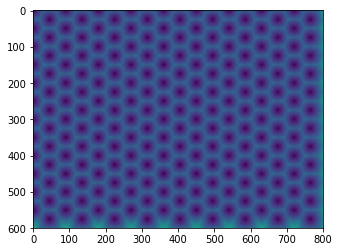

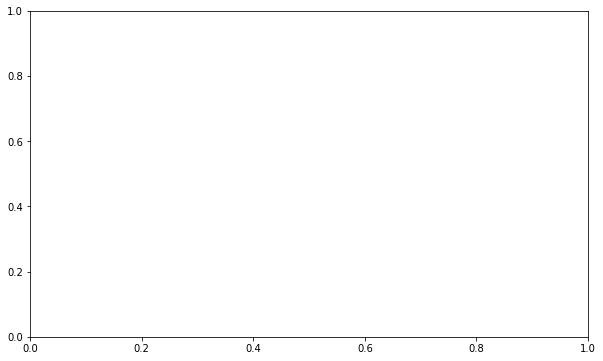

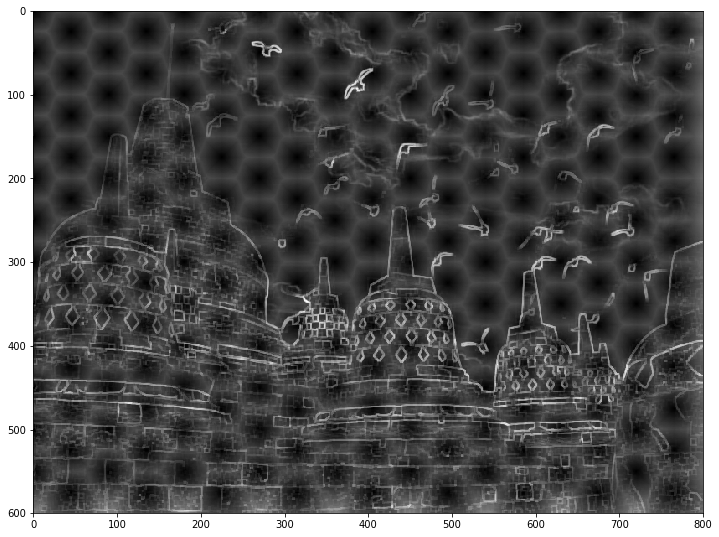

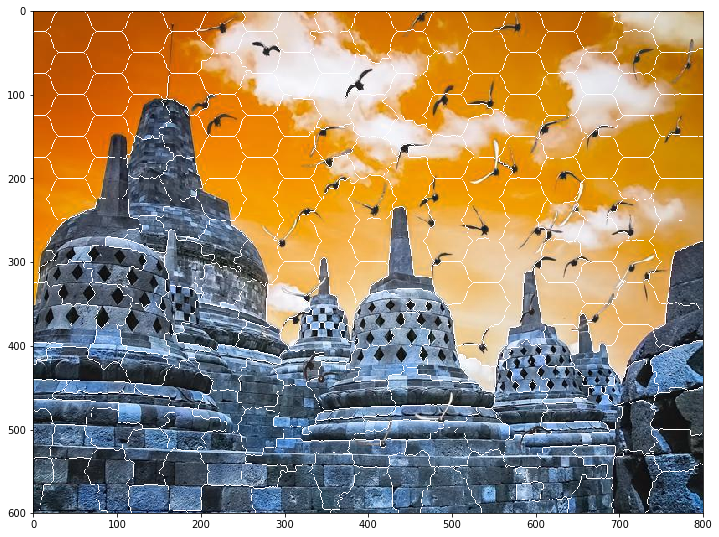

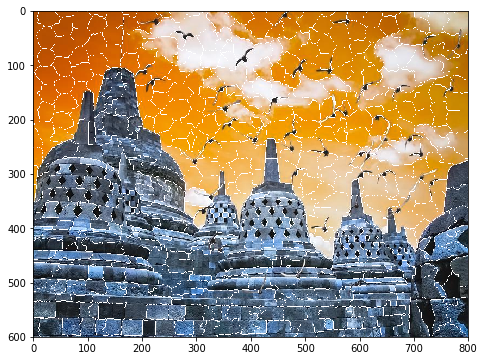

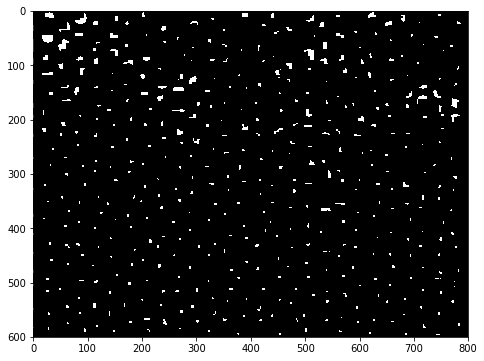

In [0]:

img0 = cv2.imread("freeimages.jpg") # reads image as grayscale
grayimg = cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY)
height,width=grayimg.shape

kernel = create_kernel(3)
kernel1 = create_kernel(5)

grayopen = cv2.morphologyEx(grayimg, cv2.MORPH_OPEN, kernel1) 
gradimg = cv2.morphologyEx(grayopen, cv2.MORPH_GRADIENT, kernel)

tst1=c_waterpixel(1,30) #var1=coeff multiplier par carte distance/var2=taille cellule
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(tst1)
#voir resultat1 enregistrer  car il y a un probléme d'affichage 
tst2=m_waterpixel(0.1,50,20)#var1=coeff multiplier par carte distance/ var2=seuillage/var3=taille cellule
ax.imshow(tst2)
#voir resultat2





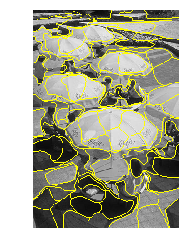

--- 0.438359022141 seconds ---


In [0]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
import argparse
 
# construct the argument parser and parse the arguments

image = cv2.imread("Superpixels.jpg") 
# loop over the number of segments
start_time = time.time()
for numSegments in (100,):
	# apply SLIC and extract (approximately) the supplied number
	# of segments
	segments = slic(image, n_segments = numSegments, sigma = 5)
 
	# show the output of SLIC
	fig = plt.figure("Superpixels -- %d segments" % (numSegments))
	ax = fig.add_subplot(1, 1, 1)
	norm_image = cv2.normalize(mark_boundaries(image, segments,color=1), None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
	norm_image=norm_image.astype(np.uint8)
	ax.imshow(mark_boundaries(image, segments))
	plt.axis("off")
	image[segments==0]=255
# show the plots
	cv2.imwrite("SLIC.png",norm_image)
plt.show()
print("--- %s seconds ---" % (time.time() - start_time))

In [0]:
#First regularity metric
print (CDmetric(labels))
print (CDmetric(labels2))
print (CDmetric(mark_boundaries(np.full(segments.shape,255), segments,color=0)))


0.0545074189934
0.0591317413747
0.360340930434


('number', 80)
(270, 39, 293, 180)
0.7114773579
('number', 81)
(248, 52, 321, 161)
0.726562228369
('number', 89)
(238, 69, 298, 194)
0.778858911124


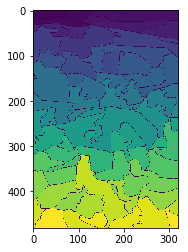

In [0]:
#Second regularity metric
def MFmetric(label):
  h0,w0=label.shape
  h=h0
  w=w0
  averagecell=np.zeros(label.shape)
  k=1;
  co=1;
  mini=h/2
  minj=w/2
  maxi=h/2
  maxj=w/2
  airmoyen=0
  L=[]
  LI={}
  for i in range(0,h0):
    for j in range(0,w0):
      if(label[i][j]>0):
        if(label[i][j] not in LI.keys()):

          LI[label[i][j]]=len(L)
          L.append([i,j,i,j])
        else:
          si,sj,ei,ej=L[LI[label[i][j]]]
          L[LI[label[i][j]]]=[min(i,si),min(sj,j),max(ei,i),max(j,ej)]
  print("number",len(LI))
  for n in LI.items():
    bi=0
    bj=0
    co=0
    k=n[0]
    si,sj,ei,ej=L[n[1]]
    for i in range(si,ei):
      for j in range(sj,ej):
        if(label[i][j]==k):
          bi=bi+i
          bj=bj+j
          co=co+1
    inter=0
    union=0
    if(co!=0):
      bi=bi/co
      bj=bj/co
      airmoyen=airmoyen+co
      for i in range(si,ei):
        for j in range(sj,ej):
          if(label[i][j]==k):
            maxj=max(maxj,(w/2)+(j-bj))
            minj=min(minj,(w/2)+(j-bj))
            maxi=max(maxi,(h/2)+(i-bi))
            mini=min(mini,(h/2)+(i-bi))
            averagecell[(h/2)+(i-bi)][(w/2)+(j-bj)]=averagecell[(h/2)+(i-bi)][(w/2)+(j-bj)]+1
  
  airmoyen=airmoyen/(len(LI))
  plt.imshow(averagecell)
  print(maxj,minj,maxi,mini)
  area=0
  for f in range(k-2,0,-1):
    avg=np.zeros((h,w))
    for i in range(mini,maxi+1):
      for j in range(minj,maxj+1):
        if(averagecell[i][j]>=f):
          area=area+1
          avg[i][j]=1;
    if(area>=airmoyen):
      break
  #print(f)
  #plt.imshow(avg)
  res=0.0
  k=0;
  for n in LI.items():
    bi=0
    bj=0
    co=0
    k=n[0]
    si,sj,ei,ej=L[n[1]]
    for i in range(si,ei):
      for j in range(sj,ej):
        if(label[i][j]==k):
          bi=bi+i
          bj=bj+j
          co=co+1
    if(co!=0):
      bi=bi/co
      bj=bj/co
      inter=0
      #print("yoo",k,"s",co)
      union=0
      for i in range(si,ei):
        for j in range(sj,ej):
          if(label[i][j]==k and avg[(h/2)+(i-bi)][(w/2)+(j-bj)]==1):
            inter=inter+1
          if(label[i][j]==k or avg[(h/2)+(i-bi)][(w/2)+(j-bj)]==1): 
            union=union+1
      res=res+(1-float(inter)/float(union))
    k=k+1
  res=res/(len(LI))
  print(res)
MFmetric(labels)
MFmetric(labels2)
MFmetric(segments)
plt.imshow(labels2)

0.459528808024
0.665033823186
0.537672031724


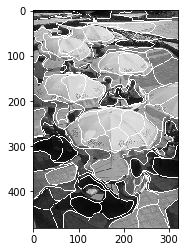

In [0]:
#Third regularity metric
def BRmetric(label,GT,d=0):
  h,w=GT.shape
  total=0
  res=0
  for i in range(0,h):
    for j in range(0,w):
      if(GT[i][j]==0):
        a=0
        total=total+1
        for ii in range(max(0,i-3),min(i+3,h)):
          for jj in range(max(0,j-3),min(j+3,w)):
            if(label[ii][jj]==d):
              a=1
        if(a==1):
          res=res+1
  return float(res)/total;
GT=cv2.imread("groundtruth.jpg",cv2.IMREAD_GRAYSCALE)
print(BRmetric(labels,GT))
print(BRmetric(labels2,GT))

print(BRmetric(cv2.cvtColor(norm_image, cv2.COLOR_BGR2GRAY),GT,255))
plt.imshow(cv2.cvtColor(norm_image, cv2.COLOR_BGR2GRAY),cmap="gray")

('number', 315)
(223, 98, 270, 205)
0.774540484468
('number', 160)
(227, 104, 277, 201)
0.754799121758
('number', 105)
(240, 78, 286, 182)
0.777061287459
('number', 80)
(236, 51, 294, 181)
0.743514322484
('number', 60)
(304, 59, 300, 177)
0.673884879062
('number', 313)
(194, 128, 263, 219)
0.767356631809
('number', 161)
(221, 75, 282, 199)
0.772028247826
('number', 107)
(241, 78, 282, 182)
0.77757123932
('number', 81)
(236, 51, 295, 188)
0.747984079411
('number', 60)
(291, 78, 297, 177)
0.667059136891
('number', 311)
(212, 112, 272, 208)
0.818025054484
('number', 162)
(199, 105, 274, 205)
0.739447943158
('number', 105)
(226, 78, 286, 191)
0.763055574592
('number', 81)
(228, 60, 295, 172)
0.736475527666
('number', 62)
(301, 62, 293, 175)
0.661799713375
('number', 311)
(197, 118, 272, 208)
0.820522925599
('number', 162)
(203, 92, 277, 196)
0.802810587713
('number', 106)
(239, 76, 288, 199)
0.778560291846
('number', 82)
(249, 88, 309, 170)
0.736417012869
('number', 62)
(281, 44, 291, 183)

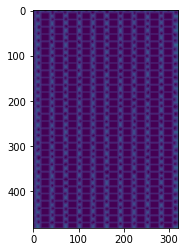

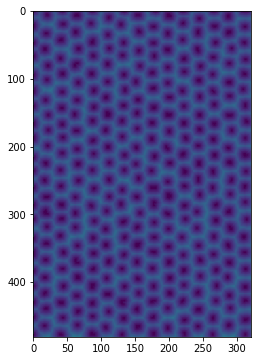

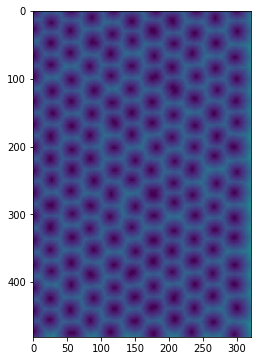

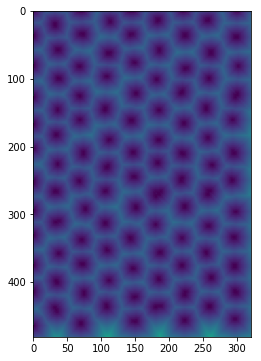

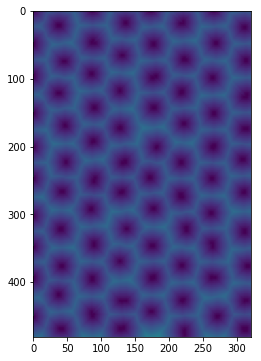

...

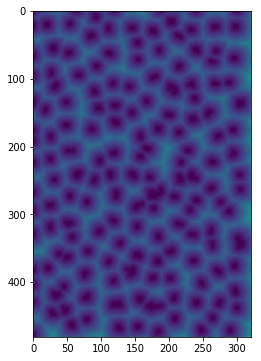

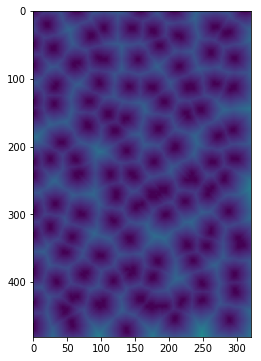

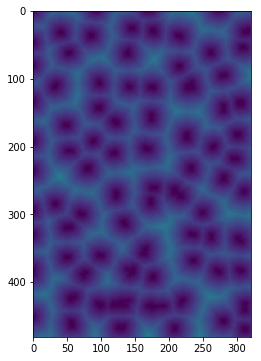

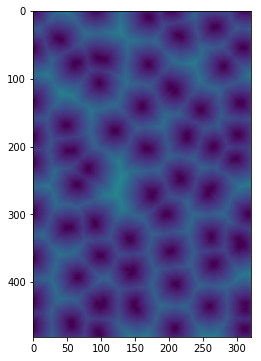

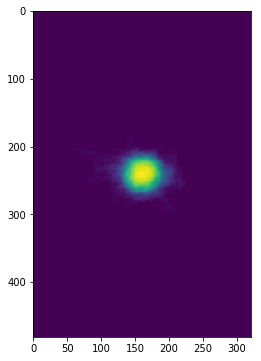

In [0]:
#recherche de meilleur parametre
import numpy as np
m=-1;
for k in np.arange(1,1.7,0.2):
  for s in range(20,70,10):
    for c in range(10,40,5):
      m_waterpixel(k,s,c)
      if(CDmetric(labels2)<0.1 and MFmetric(labels2)<0.75):
        br=BRmetric(labels2,GT)
        if(br>m):
          m=br
          kmax=k
          smax=s
          cmax=c
print("meilleur parametre: coef fusion ",kmax,"seuillage",smax,"taille cellule",cmax)

array([[[ 34,  34,  34],
        [ 27,  27,  27],
        [ 47,  47,  47],
        ...,
        [ 86,  86,  86],
        [ 79,  79,  79],
        [ 90,  90,  90]],

       [[ 21,  21,  21],
        [ 18,  18,  18],
        [ 32,  32,  32],
        ...,
        [ 96,  96,  96],
        [ 96,  96,  96],
        [ 98,  98,  98]],

       [[ 21,  21,  21],
        [ 23,  23,  23],
        [ 26,  26,  26],
        ...,
        [ 94,  94,  94],
        [ 91,  91,  91],
        [ 94,  94,  94]],

       ...,

       [[134, 134, 134],
        [135, 135, 135],
        [133, 133, 133],
        ...,
        [ 51,  51,  51],
        [ 51,  51,  51],
        [ 54,  54,  54]],

       [[134, 134, 134],
        [133, 133, 133],
        [131, 131, 131],
        ...,
        [ 63,  63,  63],
        [ 64,  64,  64],
        [ 55,  55,  55]],

       [[132, 132, 132],
        [131, 131, 131],
        [140, 140, 140],
        ...,
        [ 51,  51,  51],
        [ 58,  58,  58],
        [ 59,  59,  59]]

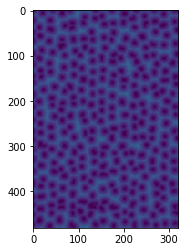

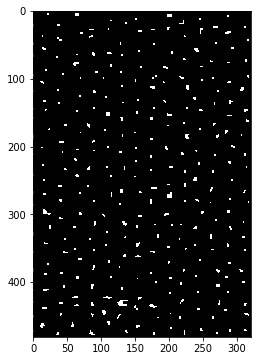

In [0]:
m_waterpixel(kmax,smax,cmax)